<a href="https://colab.research.google.com/github/devrave/Analisis_salarios_data_2025/blob/main/analitica_salarios.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Determinantes del salario en profesionales de datos (2025)

Este notebook analiza los factores que explican el salario de los profesionales de datos usando la encuesta Stack Overflow Developer Survey 2025.

## 1. Importar librerías necesarias

En este paso importamos las librerías que usaremos para análisis de datos y visualización. Explicaremos para qué sirve cada una.

In [12]:
# pandas: para manipulación y análisis de datos
# numpy: para operaciones numéricas
# matplotlib y seaborn: para visualización de datos
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# Configuración de gráficos para que se vean bien en el notebook
# La función sns.set() está deprecada, así que usamos set_theme()
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)

print("Librerías importadas correctamente ✔️")

Librerías importadas correctamente ✔️


In [13]:
# Configuración global para mostrar todos los datos en pandas
import pandas as pd
pd.set_option('display.max_rows', None)  # Muestra todas las filas
pd.set_option('display.max_columns', None)  # Muestra todas las columnas
pd.set_option('display.width', None)  # No limita el ancho de la consola
pd.set_option('display.max_colwidth', None)  # Muestra el contenido completo de cada celda

## 2. Cargar y explorar los datos

En este paso vamos a cargar el archivo survey_results_public.csv y a explorar las primeras filas para entender la estructura de los datos. Explicaremos cada línea de código.

In [14]:
# Cargar el archivo CSV en un DataFrame de pandas
# El parámetro encoding='utf-8' es estándar, pero si da error prueba con 'latin1' o 'ISO-8859-1'
df = pd.read_csv('/content/drive/MyDrive/Analisis_de_datos/Proyecto_analitica/survey_results_public.csv', encoding='utf-8')

print("Datos cargados correctamente ✔️")

# Mostrar las primeras 5 filas del DataFrame para ver la estructura de los datos
df.head()

/tmp/ipython-input-3259010491.py:3: DtypeWarning: Columns (56,74,92,97,98,105,109,110,132,162,165) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/Analisis_de_datos/Proyecto_analitica/survey_results_public.csv', encoding='utf-8')


Datos cargados correctamente ✔️


,ResponseId,MainBranch,Age,EdLevel,Employment,EmploymentAddl,WorkExp,LearnCodeChoose,LearnCode,LearnCodeAI,AILearnHow,YearsCode,DevType,OrgSize,ICorPM,RemoteWork,PurchaseInfluence,TechEndorseIntro,TechEndorse_1,TechEndorse_2,TechEndorse_3,TechEndorse_4,TechEndorse_5,TechEndorse_6,TechEndorse_7,TechEndorse_8,TechEndorse_9,TechEndorse_13,TechEndorse_13_TEXT,TechOppose_1,TechOppose_2,TechOppose_3,TechOppose_5,TechOppose_7,TechOppose_9,TechOppose_11,TechOppose_13,TechOppose_16,TechOppose_15,TechOppose_15_TEXT,Industry,JobSatPoints_1,JobSatPoints_2,JobSatPoints_3,JobSatPoints_4,JobSatPoints_5,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,JobSatPoints_13,JobSatPoints_14,JobSatPoints_15,JobSatPoints_16,JobSatPoints_15_TEXT,AIThreat,NewRole,ToolCountWork,ToolCountPersonal,Country,Currency,CompTotal,LanguageChoice,LanguageHaveWorkedWith,LanguageWantToWorkWith,LanguageAdmired,LanguagesHaveEntry,LanguagesWantEntry,DatabaseChoice,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,DatabaseAdmired,DatabaseHaveEntry,DatabaseWantEntry,PlatformChoice,PlatformHaveWorkedWith,PlatformWantToWorkWith,PlatformAdmired,PlatformHaveEntry,PlatformWantEntry,WebframeChoice,WebframeHaveWorkedWith,WebframeWantToWorkWith,WebframeAdmired,WebframeHaveEntry,WebframeWantEntry,DevEnvsChoice,DevEnvsHaveWorkedWith,DevEnvsWantToWorkWith,DevEnvsAdmired,DevEnvHaveEntry,DevEnvWantEntry,SOTagsHaveWorkedWith,SOTagsWantToWorkWith,SOTagsAdmired,SOTagsHaveEntry,SOTagsWant Entry,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackAsyncAdmired,OfficeStackHaveEntry,OfficeStackWantEntry,CommPlatformHaveWorkedWith,CommPlatformWantToWorkWith,CommPlatformAdmired,CommPlatformHaveEntr,CommPlatformWantEntr,AIModelsChoice,AIModelsHaveWorkedWith,AIModelsWantToWorkWith,AIModelsAdmired,AIModelsHaveEntry,AIModelsWantEntry,SOAccount,SOVisitFreq,SODuration,SOPartFreq,SO_Dev_Content,SO_Actions_1,SO_Actions_16,SO_Actions_3,SO_Actions_4,SO_Actions_5,SO_Actions_6,SO_Actions_9,SO_Actions_7,SO_Actions_10,SO_Actions_15,SO_Actions_15_TEXT,SOComm,SOFriction,AISelect,AISent,AIAcc,AIComplex,AIToolCurrently partially AI,AIToolDon't plan to use AI for this task,AIToolPlan to partially use AI,AIToolPlan to mostly use AI,AIToolCurrently mostly AI,AIFrustration,AIExplain,AIAgents,AIAgentChange,AIAgent_Uses,AgentUsesGeneral,AIAgentImpactSomewhat agree,AIAgentImpactNeutral,AIAgentImpactSomewhat disagree,AIAgentImpactStrongly agree,AIAgentImpactStrongly disagree,AIAgentChallengesNeutral,AIAgentChallengesSomewhat disagree,AIAgentChallengesStrongly agree,AIAgentChallengesSomewhat agree,AIAgentChallengesStrongly disagree,AIAgentKnowledge,AIAgentKnowWrite,AIAgentOrchestration,AIAgentOrchWrite,AIAgentObserveSecure,AIAgentObsWrite,AIAgentExternal,AIAgentExtWrite,AIHuman,AIOpen,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,25-34 years old,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Employed,"Caring for dependents (children, elderly, etc.)",8.0,"Yes, I am not new to coding but am learning new coding techniques or programming language","Online Courses or Certification (includes all media types);Other online resources (e.g. standard search, forum, online community)","Yes, I learned how to use AI-enabled tools for my personal curiosity and/or hobbies",AI CodeGen tools or AI-enabled apps,14.0,"Developer, mobile",20 to 99 employees,People manager,Remote,"Yes, I influenced the purchase of a substantial addition to the tech stack",Work,10.0,7.0,9.0,6.0,3.0,11.0,12.0,1.0,8.0,14.0,NaN,15.0,7.0,8.0,12.0,11.0,1.0,6.0,13.0,3.0,16.0,NaN,Fintech,3.0,1.0,4.0,9.0,5.0,10.0,12.0,11.0,2.0,6.0,7.0,13.0,14.0,15.0,8.0,NaN,I'm not sure,I have neither consider or transitioned into a new career or industry,7.0,3.0,Ukraine,EUR European Euro,52800.0,Yes,Bash/Shell (all shells);Dart;SQL,Dart,Dart,NaN,NaN,Yes,Cloud Firestore;PostgreSQL,NaN,NaN,NaN,NaN,Yes,Amazon Web Services (AWS);Cloudflare;Firebase;Google Cloud;Gradle,NaN

In [15]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### 2.1. Exploración inicial de las columnas y tipos de datos

Ahora que cargamos los datos, vamos a ver qué columnas tiene el archivo, qué tipo de información contiene cada una y cómo están representadas las variables clave para nuestro análisis.

Esto nos ayudará a identificar si necesitamos limpiar, transformar o seleccionar variables antes de cualquier análisis profundo.

#### ¿Qué columnas tiene el DataFrame?
Esto nos permite ver todas las variables disponibles para el análisis y su orden.

In [16]:
# Mostramos el listado de columnas del DataFrame
display(df.columns.tolist())

['ResponseId',
 'MainBranch',
 'Age',
 'EdLevel',
 'Employment',
 'EmploymentAddl',
 'WorkExp',
 'LearnCodeChoose',
 'LearnCode',
 'LearnCodeAI',
 'AILearnHow',
 'YearsCode',
 'DevType',
 'OrgSize',
 'ICorPM',
 'RemoteWork',
 'PurchaseInfluence',
 'TechEndorseIntro',
 'TechEndorse_1',
 'TechEndorse_2',
 'TechEndorse_3',
 'TechEndorse_4',
 'TechEndorse_5',
 'TechEndorse_6',
 'TechEndorse_7',
 'TechEndorse_8',
 'TechEndorse_9',
 'TechEndorse_13',
 'TechEndorse_13_TEXT',
 'TechOppose_1',
 'TechOppose_2',
 'TechOppose_3',
 'TechOppose_5',
 'TechOppose_7',
 'TechOppose_9',
 'TechOppose_11',
 'TechOppose_13',
 'TechOppose_16',
 'TechOppose_15',
 'TechOppose_15_TEXT',
 'Industry',
 'JobSatPoints_1',
 'JobSatPoints_2',
 'JobSatPoints_3',
 'JobSatPoints_4',
 'JobSatPoints_5',
 'JobSatPoints_6',
 'JobSatPoints_7',
 'JobSatPoints_8',
 'JobSatPoints_9',
 'JobSatPoints_10',
 'JobSatPoints_11',
 'JobSatPoints_13',
 'JobSatPoints_14',
 'JobSatPoints_15',
 'JobSatPoints_16',
 'JobSatPoints_15_TEXT',
 

####2.2 ¿Qué tipo de datos tiene cada columna?
Esto ayuda a identificar si alguna variable requiere conversión de tipo o tratamiento especial. También haremos un loop para identificar el numero de la columna e identificarla mas rápido.


In [17]:
# Mostramos los tipos de datos de cada columna y le vamos agregar una numeracion para facilitar la referencia
print("Tipos de datos de cada columna:")
print("-" * 40)
for i, col in enumerate(df.columns,start=1):
    print(f"{i}: {col} - {df[col].dtype}")

Tipos de datos de cada columna:
----------------------------------------
1: ResponseId - int64
2: MainBranch - object
3: Age - object
4: EdLevel - object
5: Employment - object
6: EmploymentAddl - object
7: WorkExp - float64
8: LearnCodeChoose - object
9: LearnCode - object
10: LearnCodeAI - object
11: AILearnHow - object
12: YearsCode - float64
13: DevType - object
14: OrgSize - object
15: ICorPM - object
16: RemoteWork - object
17: PurchaseInfluence - object
18: TechEndorseIntro - object
19: TechEndorse_1 - float64
20: TechEndorse_2 - float64
21: TechEndorse_3 - float64
22: TechEndorse_4 - float64
23: TechEndorse_5 - float64
24: TechEndorse_6 - float64
25: TechEndorse_7 - float64
26: TechEndorse_8 - float64
27: TechEndorse_9 - float64
28: TechEndorse_13 - float64
29: TechEndorse_13_TEXT - object
30: TechOppose_1 - float64
31: TechOppose_2 - float64
32: TechOppose_3 - float64
33: TechOppose_5 - float64
34: TechOppose_7 - float64
35: TechOppose_9 - float64
36: TechOppose_11 - float64
3

####2.3 Resumen estadístico de las variables numéricas
Permite ver rápidamente la media, desviación estándar, valores mínimos y máximos, y detectar posibles outliers.

In [18]:
# Mostramos un resumen estadístico de las variables numéricas
display(df.describe(include='all'))

,ResponseId,MainBranch,Age,EdLevel,Employment,EmploymentAddl,WorkExp,LearnCodeChoose,LearnCode,LearnCodeAI,AILearnHow,YearsCode,DevType,OrgSize,ICorPM,RemoteWork,PurchaseInfluence,TechEndorseIntro,TechEndorse_1,TechEndorse_2,TechEndorse_3,TechEndorse_4,TechEndorse_5,TechEndorse_6,TechEndorse_7,TechEndorse_8,TechEndorse_9,TechEndorse_13,TechEndorse_13_TEXT,TechOppose_1,TechOppose_2,TechOppose_3,TechOppose_5,TechOppose_7,TechOppose_9,TechOppose_11,TechOppose_13,TechOppose_16,TechOppose_15,TechOppose_15_TEXT,Industry,JobSatPoints_1,JobSatPoints_2,JobSatPoints_3,JobSatPoints_4,JobSatPoints_5,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,JobSatPoints_13,JobSatPoints_14,JobSatPoints_15,JobSatPoints_16,JobSatPoints_15_TEXT,AIThreat,NewRole,ToolCountWork,ToolCountPersonal,Country,Currency,CompTotal,LanguageChoice,LanguageHaveWorkedWith,LanguageWantToWorkWith,LanguageAdmired,LanguagesHaveEntry,LanguagesWantEntry,DatabaseChoice,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,DatabaseAdmired,DatabaseHaveEntry,DatabaseWantEntry,PlatformChoice,PlatformHaveWorkedWith,PlatformWantToWorkWith,PlatformAdmired,PlatformHaveEntry,PlatformWantEntry,WebframeChoice,WebframeHaveWorkedWith,WebframeWantToWorkWith,WebframeAdmired,WebframeHaveEntry,WebframeWantEntry,DevEnvsChoice,DevEnvsHaveWorkedWith,DevEnvsWantToWorkWith,DevEnvsAdmired,DevEnvHaveEntry,DevEnvWantEntry,SOTagsHaveWorkedWith,SOTagsWantToWorkWith,SOTagsAdmired,SOTagsHaveEntry,SOTagsWant Entry,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackAsyncAdmired,OfficeStackHaveEntry,OfficeStackWantEntry,CommPlatformHaveWorkedWith,CommPlatformWantToWorkWith,CommPlatformAdmired,CommPlatformHaveEntr,CommPlatformWantEntr,AIModelsChoice,AIModelsHaveWorkedWith,AIModelsWantToWorkWith,AIModelsAdmired,AIModelsHaveEntry,AIModelsWantEntry,SOAccount,SOVisitFreq,SODuration,SOPartFreq,SO_Dev_Content,SO_Actions_1,SO_Actions_16,SO_Actions_3,SO_Actions_4,SO_Actions_5,SO_Actions_6,SO_Actions_9,SO_Actions_7,SO_Actions_10,SO_Actions_15,SO_Actions_15_TEXT,SOComm,SOFriction,AISelect,AISent,AIAcc,AIComplex,AIToolCurrently partially AI,AIToolDon't plan to use AI for this task,AIToolPlan to partially use AI,AIToolPlan to mostly use AI,AIToolCurrently mostly AI,AIFrustration,AIExplain,AIAgents,AIAgentChange,AIAgent_Uses,AgentUsesGeneral,AIAgentImpactSomewhat agree,AIAgentImpactNeutral,AIAgentImpactSomewhat disagree,AIAgentImpactStrongly agree,AIAgentImpactStrongly disagree,AIAgentChallengesNeutral,AIAgentChallengesSomewhat disagree,AIAgentChallengesStrongly agree,AIAgentChallengesSomewhat agree,AIAgentChallengesStrongly disagree,AIAgentKnowledge,AIAgentKnowWrite,AIAgentOrchestration,AIAgentOrchWrite,AIAgentObserveSecure,AIAgentObsWrite,AIAgentExternal,AIAgentExtWrite,AIHuman,AIOpen,ConvertedCompYearly,JobSat
count,49191.000000,49191,49191,48149,48339,44875,42893.000000,46858,33556,45201,28257,43042.000000,43680,34178,33243,33780,37437,37556,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,2009,34259.000000,34259.000000,34259.000000,34259.000000,34259.000000,34259.000000,34259.000000,34259.000000,34259.000000,34259.000000,1647,33642,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,24943.000000,664,36078,35527,27611.000000,25582.000000,35437,35437,2.486600e+04,32214,31671,27079,23470,3982,3150,31688,25550,19733,17295,2150,1533,31262,24258,19415,17822,3957,3100,31193,22992,17639,15709,3294,2630,31079,26019,20614,19492,2762,2112,17922,13587,12240,458,430,31417,28883,29858,23206,22208,2589,1617,30065,23351,22877,1476,1184,30239,16281,11845,11284,776,475,32797,32710,32627,32228,22836,26260.000000,24340.000000,26260.000000,26260.000000,26260.000000,26260.000000,26260.000000,26260.000000,26260.000000,26260.000000,823,

#### 2.4 Valores nulos por columna
Revisar los valores nulos ayuda a identificar posibles problemas de calidad de datos y a planear estrategias de limpieza o imputación.

In [19]:
# Valores nulos por columna
display(df.isnull().sum())

,0
ResponseId,0
MainBranch,0
Age,0
EdLevel,1042
Employment,852
EmploymentAddl,4316
WorkExp,6298
LearnCodeChoose,2333
LearnCode,15635
LearnCodeAI,3990


#### 2.5 ¿Cuántos valores únicos tiene cada columna?
Este análisis permite identificar variables con baja variabilidad (posibles candidatas a eliminar) o con demasiadas categorías, lo que puede complicar el análisis o la modelización.

In [20]:
# Cantidad de valores únicos por columna
display(df.nunique(dropna=False))

,0
ResponseId,49191
MainBranch,6
Age,7
EdLevel,9
Employment,7
EmploymentAddl,172
WorkExp,73
LearnCodeChoose,4
LearnCode,2768
LearnCodeAI,6


### 2.6 Análisis exploratorio inicial
 Análisis exploratorio inicial (enfocado en la problemática del estudio)

En el mercado laboral tecnológico de 2025, los salarios de los profesionales de datos muestran diferencias importantes entre perfiles, contextos y condiciones de trabajo. Estas diferencias no se asumen como aleatorias: buscamos identificar **qué factores explican mejor el salario** y **qué combinaciones de condiciones se asocian con mejores resultados salariales**.

Para orientar este análisis, trabajamos con dos listas previamente definidas en el notebook: `variables_clave` y `columnas_principales`. En la práctica, ambas listas concentran las columnas que identificamos como necesarias para responder nuestras preguntas de investigación.

Las columnas seleccionadas son:

- `Age`
- `EdLevel`
- `Employment`
- `WorkExp`
- `YearsCode`
- `DevType`
- `OrgSize`
- `ICorPM`
- `RemoteWork`
- `Industry`
- `Country`
- `CompTotal`
- `LanguageHaveWorkedWith`
- `DatabaseChoice`
- `DatabaseHaveWorkedWith`
- `ConvertedCompYearly`

Estas variables nos permiten cubrir, de forma explícita, cada dimensión de la problemática:

- **Experiencia**: `WorkExp`, `YearsCode`
- **Ubicación geográfica**: `Country`
- **Modalidad de trabajo**: `RemoteWork`
- **Tamaño de empresa**: `OrgSize`
- **Tipo de vinculación/contrato**: `Employment`
- **Rol y tipo de función**: `DevType`, `ICorPM`
- **Sector/industria**: `Industry`
- **Perfil y capital humano**: `Age`, `EdLevel`
- **Compensación (objetivo de análisis)**: `ConvertedCompYearly`, `CompTotal`
- **Contexto técnico del perfil**: `LanguageHaveWorkedWith`, `DatabaseChoice`, `DatabaseHaveWorkedWith`

A partir de esta base, el análisis exploratorio inicial persigue dos objetivos concretos:

1. **Identificar importancia relativa de factores salariales**
   Examinar cómo cambia la distribución del salario cuando cambia cada factor para reconocer cuáles generan mayores diferencias.

2. **Detectar combinaciones asociadas con salarios más altos**
   Evaluar perfiles combinados (por ejemplo: mayor experiencia + remoto + empresa grande + industria específica + país específico) para encontrar patrones de mayor remuneración.

En términos prácticos, este enfoque permite responder la problemática planteada desde una perspectiva aplicada:

- Para **empresas**: aporta evidencia para diseñar bandas salariales más competitivas y coherentes con el mercado global.
- Para **profesionales**: ayuda a priorizar decisiones de carrera (rol, industria, modalidad, ubicación) con mayor impacto económico.
- Para **estrategia de talento**: facilita segmentar perfiles y definir mejores políticas de atracción, retención y desarrollo.


In [21]:
# Analisis de valores unicos y distribucion en variables clave

variables_clave = [
    "Age",          # 3
    "EdLevel",      # 4
    "Employment",   # 5
    "WorkExp",      # 7
    "YearsCode",    # 12
    "DevType",      # 13
    "OrgSize",      # 14
    "ICorPM",       # 15
    "RemoteWork",   # 16
    "Industry",     # 41
    "Country",      # 62
    "CompTotal",    # 64
    "LanguageHaveWorkedWith",  # 66
    "DatabaseChoice",          # 71
    "DatabaseHaveWorkedWith",  # 72
    "ConvertedCompYearly",     # 171
 ]

for var in variables_clave:
    if var in df.columns:
        print(f"\n--- {var}: valores unicos y distribucion ---")
        display(df[var].value_counts()) #Nos toca reemplazar print por display dado que los datos son muy grandes y google collab solo reconoce hasta el retorno de 5000 filas
    else:
        print(f"\n--- {var}: columna no encontrada en el dataset ---")


--- Age: valores unicos y distribucion ---


,count
Age,
25-34 years old,16519
35-44 years old,13241
18-24 years old,9210
45-54 years old,6275
55-64 years old,2626
65 years or older,942
Prefer not to say,378



--- EdLevel: valores unicos y distribucion ---


,count
EdLevel,
"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",20278
"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",12589
Some college/university study without earning a degree,6182
"Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)",3631
"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",2624
"Associate degree (A.A., A.S., etc.)",1562
Other (please specify):,701
Primary/elementary school,582



--- Employment: valores unicos y distribucion ---


,count
Employment,
Employed,33750
"Independent contractor, freelancer, or self-employed",6708
Student,4428
Not employed,2227
Retired,708
I prefer not to say,518



--- WorkExp: valores unicos y distribucion ---


,count
WorkExp,
10.0,2885
3.0,2613
5.0,2563
1.0,2453
2.0,2408
15.0,2226
4.0,2166
20.0,2094
8.0,1963



--- YearsCode: valores unicos y distribucion ---


,count
YearsCode,
10.0,3108
15.0,2540
20.0,2497
5.0,2267
8.0,2113
6.0,1925
25.0,1832
7.0,1820
12.0,1800



--- DevType: valores unicos y distribucion ---


,count
DevType,
"Developer, full-stack",12351
"Developer, back-end",6453
Student,3008
"Architect, software or solutions",2684
"Developer, front-end",1974
"Developer, desktop or enterprise applications",1919
Other (please specify):,1825
"Developer, mobile",1391
"Developer, embedded applications or devices",1274



--- OrgSize: valores unicos y distribucion ---


,count
OrgSize,
20 to 99 employees,6688
100 to 499 employees,6109
Less than 20 employees,5600
"10,000 or more employees",4965
"1,000 to 4,999 employees",4156
500 to 999 employees,2361
"Just me - I am a freelancer, sole proprietor, etc.",1763
"5,000 to 9,999 employees",1604
I don’t know,932



--- ICorPM: valores unicos y distribucion ---


,count
ICorPM,
Individual contributor,28341
People manager,4902



--- RemoteWork: valores unicos y distribucion ---


,count
RemoteWork,
Remote,10931
"Hybrid (some remote, leans heavy to in-person)",6732
In-person,6042
"Hybrid (some in-person, leans heavy to flexibility)",5831
"Your choice (very flexible, you can come in when you want or just as needed)",4244



--- Industry: valores unicos y distribucion ---


,count
Industry,
Software Development,16282
Other:,2667
"Internet, Telecomm or Information Services",1698
Fintech,1690
Banking/Financial Services,1437
Healthcare,1397
Manufacturing,1315
Government,1183
Higher Education,1167



--- Country: valores unicos y distribucion ---


,count
Country,
United States of America,7233
Germany,3025
India,2547
United Kingdom of Great Britain and Northern Ireland,2042
France,1409
Canada,1305
Ukraine,964
Poland,888
Netherlands,867



--- CompTotal: valores unicos y distribucion ---


,count
CompTotal,
0.000000e+00,751
1.000000e+05,705
1.200000e+05,603
6.000000e+04,587
1.500000e+05,522
8.000000e+04,505
5.000000e+04,466
7.000000e+04,429
2.000000e+05,402



--- LanguageHaveWorkedWith: valores unicos y distribucion ---


,count
LanguageHaveWorkedWith,
HTML/CSS;JavaScript;TypeScript,370
Python,229
C#;HTML/CSS;JavaScript;SQL;TypeScript,193
HTML/CSS;JavaScript;PHP;SQL,180
Python;SQL,169
C#;HTML/CSS;JavaScript;SQL,167
C#;HTML/CSS;JavaScript;PowerShell;SQL;TypeScript,160
C#,151
Bash/Shell (all shells);Python;SQL,143



--- DatabaseChoice: valores unicos y distribucion ---


,count
DatabaseChoice,
Yes,26265
No,5423



--- DatabaseHaveWorkedWith: valores unicos y distribucion ---


,count
DatabaseHaveWorkedWith,
PostgreSQL,1213
Microsoft SQL Server,1085
MySQL,594
PostgreSQL;SQLite,575
SQLite,549
PostgreSQL;Redis,360
MongoDB,302
Microsoft SQL Server;SQLite,281
MariaDB;MySQL,277



--- ConvertedCompYearly: valores unicos y distribucion ---


,count
ConvertedCompYearly,
69609.0,328
58007.0,270
92812.0,269
81210.0,266
116015.0,263
150000.0,235
200000.0,220
120000.0,203
46406.0,198


In [22]:
# Porcentaje de valores nulos en las principales columnas
print("Porcentaje de valores nulos en las principales columnas:")
columnas_principales = [
    "Age",
    "EdLevel",
    "Employment",
    "WorkExp",
    "YearsCode",
    "DevType",
    "OrgSize",
    "ICorPM",
    "RemoteWork",
    "Industry",
    "Country",
    "CompTotal",
    "LanguageHaveWorkedWith",
    "DatabaseChoice",
    "DatabaseHaveWorkedWith",
    "ConvertedCompYearly",
]
for col in columnas_principales:
    if col in df.columns:
        porcentaje_nulos = df[col].isnull().mean() * 100
        print(f"  {col}: {porcentaje_nulos:.2f}% nulos")
    else:
        print(f"  {col}: columna no encontrada en el dataset")

Porcentaje de valores nulos en las principales columnas:
  Age: 0.00% nulos
  EdLevel: 2.12% nulos
  Employment: 1.73% nulos
  WorkExp: 12.80% nulos
  YearsCode: 12.50% nulos
  DevType: 11.20% nulos
  OrgSize: 30.52% nulos
  ICorPM: 32.42% nulos
  RemoteWork: 31.33% nulos
  Industry: 31.61% nulos
  Country: 27.96% nulos
  CompTotal: 49.45% nulos
  LanguageHaveWorkedWith: 35.62% nulos
  DatabaseChoice: 35.58% nulos
  DatabaseHaveWorkedWith: 48.06% nulos
  ConvertedCompYearly: 51.32% nulos


### 2.7. Cierre de fase exploratoria: calidad de datos y outliers

En esta sección cerramos el análisis exploratorio con una revisión dirigida a decidir el siguiente paso metodológico. Puntualmente evaluamos:

- calidad de datos en las columnas principales (nulos y cardinalidad),
- posibles valores atípicos en variables salariales,
- y una recomendación operativa: **continuar explorando** o **pasar a limpieza**.

Este cierre nos permite tomar una decisión basada en evidencia y no por intuición.

In [23]:
# Cierre exploratorio: calidad de datos + detección de outliers + recomendación de siguiente paso

# Si columnas_principales no existe (por ejecución parcial), la reconstruimos
if 'columnas_principales' not in globals():
    # Lista de variables clave del estudio
    columnas_principales = [
        'Age', 'EdLevel', 'Employment', 'WorkExp', 'YearsCode', 'DevType',
        'OrgSize', 'ICorPM', 'RemoteWork', 'Industry', 'Country', 'CompTotal',
        'LanguageHaveWorkedWith', 'DatabaseChoice', 'DatabaseHaveWorkedWith',
        'ConvertedCompYearly'
    ]

# Separa columnas que sí están en el dataset de las que faltan
columnas_presentes = [c for c in columnas_principales if c in df.columns]
columnas_faltantes = [c for c in columnas_principales if c not in df.columns]

# Encabezado de diagnóstico de esta fase
print('=== CIERRE FASE EXPLORATORIA ===')
print(f'Columnas principales presentes: {len(columnas_presentes)} / {len(columnas_principales)}')
if columnas_faltantes:
    # Solo imprime si hay columnas esperadas que no existen
    print('Columnas principales no encontradas:', columnas_faltantes)

# 1) Diagnóstico de calidad en columnas principales
calidad = pd.DataFrame({
    # Tipo de dato de cada columna
    'dtype': df[columnas_presentes].dtypes.astype(str),
    # Porcentaje de nulos (en porcentaje)
    'nulos_%': (df[columnas_presentes].isna().mean() * 100).round(2),
    # Número de valores únicos (incluye NaN)
    'unicos': df[columnas_presentes].nunique(dropna=False)
# Ordenamos de mayor a menor nulos para priorizar limpieza
}).sort_values('nulos_%', ascending=False)

print('\n--- Calidad de datos (columnas principales) ---')
display(calidad)

# 2) Outliers en salarios (si existen columnas salariales)
salario_cols = [c for c in ['ConvertedCompYearly', 'CompTotal'] if c in df.columns]
resumen_outliers = []

# Recorremos cada variable salarial disponible
for col in salario_cols:
    # Convierte a numérico y elimina nulos
    serie = pd.to_numeric(df[col], errors='coerce').dropna()
    # Mantiene solo valores positivos (descarta 0 y negativos)
    serie = serie[serie > 0]
    n = len(serie)

    # Si hay pocos datos válidos, evitamos conclusiones inestables
    if n < 30:
        print(f'\n{col}: sin datos suficientes para análisis robusto de outliers (n={n}).')
        continue

    # Cuartiles e IQR para regla clásica de outliers
    q1, q3 = serie.quantile([0.25, 0.75])
    iqr = q3 - q1
    li = q1 - 1.5 * iqr  # límite inferior
    ls = q3 + 1.5 * iqr  # límite superior

    # Conteo y porcentaje de outliers según IQR
    out_iqr = ((serie < li) | (serie > ls)).sum()
    pct_iqr = round((out_iqr / n) * 100, 2)

    # Percentiles 1 y 99 para medir extremos de cola
    p1, p99 = serie.quantile([0.01, 0.99])
    out_p = ((serie < p1) | (serie > p99)).sum()
    pct_p = round((out_p / n) * 100, 2)

    # Guardamos un resumen completo para cada variable salarial
    resumen_outliers.append({
        'variable': col,
        'n': n,
        'min': float(serie.min()),
        'p1': float(p1),
        'q1': float(q1),
        'mediana': float(serie.median()),
        'q3': float(q3),
        'p99': float(p99),
        'max': float(serie.max()),
        'outliers_iqr_%': pct_iqr,
        'extremos_p1_p99_%': pct_p
    })

# Convertimos la lista de resultados en DataFrame para visualizar
if resumen_outliers:
    outliers_df = pd.DataFrame(resumen_outliers)
    print('\n--- Diagnóstico de outliers en variables salariales ---')
    display(outliers_df)
else:
    # Si no hubo resultados, dejamos DataFrame vacío para no romper el flujo
    outliers_df = pd.DataFrame()
    print('\nNo se pudo construir diagnóstico de outliers salariales (columnas no disponibles o sin datos suficientes).')

# 3) Recomendación operativa: ¿seguir explorando o pasar a limpieza?
nulos_altos = int((calidad['nulos_%'] >= 20).sum()) if not calidad.empty else 0
outliers_altos = int((outliers_df['outliers_iqr_%'] >= 5).sum()) if not outliers_df.empty else 0

print('\n--- Recomendación de siguiente paso ---')
if (nulos_altos > 0) or (outliers_altos > 0):
    # Regla: si hay muchas columnas con nulos altos o outliers relevantes, limpiar
    print('Recomendación: PASAR A LIMPIEZA DIRIGIDA.')
    print(f'- Columnas con nulos >= 20%: {nulos_altos}')
    print(f'- Variables salariales con outliers IQR >= 5%: {outliers_altos}')
    print('Siguiente acción sugerida: reglas de limpieza para nulos críticos, normalización de categorías y tratamiento de extremos salariales.')
else:
    # Si no hay señales fuertes de calidad, se puede profundizar EDA
    print('Recomendación: AÚN PUEDES PROFUNDIZAR 1 ITERACIÓN EXPLORATORIA.')
    print(f'- Columnas con nulos >= 20%: {nulos_altos}')
    print(f'- Variables salariales con outliers IQR >= 5%: {outliers_altos}')
    print('Siguiente acción sugerida: análisis segmentado por país/rol/industria antes de limpiar.')

=== CIERRE FASE EXPLORATORIA ===
Columnas principales presentes: 16 / 16

--- Calidad de datos (columnas principales) ---


,dtype,nulos_%,unicos
ConvertedCompYearly,float64,51.32,6238
CompTotal,float64,49.45,2679
DatabaseHaveWorkedWith,object,48.06,6671
LanguageHaveWorkedWith,object,35.62,15479
DatabaseChoice,object,35.58,3
ICorPM,object,32.42,3
Industry,object,31.61,16
RemoteWork,object,31.33,6
OrgSize,object,30.52,10
Country,object,27.96,178



--- Diagnóstico de outliers en variables salariales ---


,variable,n,min,p1,q1,mediana,q3,p99,max,outliers_iqr_%,extremos_p1_p99_%
0,ConvertedCompYearly,23947,1.0,65.0,38171.0,75320.0,120596.0,4.408560e+05,5.000000e+07,4.43,1.98
1,CompTotal,24115,1.0,78.0,60000.0,110000.0,250000.0,8.137600e+07,5.555556e+74,16.96,2.00



--- Recomendación de siguiente paso ---
Recomendación: PASAR A LIMPIEZA DIRIGIDA.
- Columnas con nulos >= 20%: 10
- Variables salariales con outliers IQR >= 5%: 1
Siguiente acción sugerida: reglas de limpieza para nulos críticos, normalización de categorías y tratamiento de extremos salariales.


 2.8 Conclusiones del cierre exploratorio

Con base en los resultados obtenidos en la celda anterior, se concluye lo siguiente:

- Se validó la disponibilidad de las variables de análisis: **16 de 16 columnas principales presentes**.
- La calidad de datos muestra una señal clara de atención: **10 columnas presentan más del 20% de valores nulos**.
- En la variable `ConvertedCompYearly` se observa una dispersión alta, pero con una tasa de outliers IQR moderada (**4.43%**).
- En la variable `CompTotal` se identificó una cola extrema importante, con **16.96% de outliers por IQR** y un valor máximo atípico muy elevado (`5.555556e+74`), lo cual sugiere presencia de registros no realistas o ruido de captura.
- Las métricas de percentiles extremos (`p1-p99` cerca de 2%) confirman que los casos más críticos están concentrados en los extremos superiores.

En consecuencia, la evidencia respalda la decisión de **pasar a la fase de limpieza dirigida** antes de continuar con modelación o análisis comparativos de salario.

#### Decisión metodológica para continuar

1. Definir `ConvertedCompYearly` como variable salarial principal para análisis comparables.
2. Aplicar reglas de tratamiento para extremos salariales (especialmente en `CompTotal`).
3. Diseñar estrategia de nulos por tipo de variable (numéricas y categóricas).
4. Estandarizar categorías clave (`RemoteWork`, `Industry`, `Employment`, `DevType`, `OrgSize`).

Con este paso, el proyecto queda listo para iniciar la limpieza de datos con criterios consistentes y trazables.

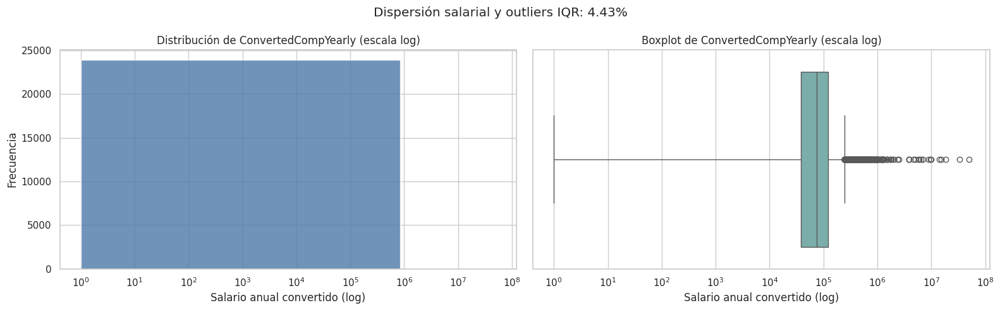

Resumen rápido:
- Q1: 38,171
- Mediana: 75,320
- Q3: 120,596
- Límite superior IQR: 244,234
- % outliers por IQR: 4.43%


In [24]:
# Visualización de dispersión y outliers en ConvertedCompYearly

# Convertimos a numérico y filtramos valores válidos
salario_anual = pd.to_numeric(df['ConvertedCompYearly'], errors='coerce').dropna()
salario_anual = salario_anual[salario_anual > 0]

# Métricas IQR para identificar outliers
q1, q3 = salario_anual.quantile([0.25, 0.75])
iqr = q3 - q1
limite_inferior = q1 - 1.5 * iqr
limite_superior = q3 + 1.5 * iqr
pct_outliers_iqr = ((salario_anual < limite_inferior) | (salario_anual > limite_superior)).mean() * 100

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# 1 Histograma en escala log para ver mejor la cola derecha
axes[0].hist(salario_anual, bins=60, color='#4C78A8', alpha=0.8)
axes[0].set_xscale('log')
axes[0].set_title('Distribución de ConvertedCompYearly (escala log)')
axes[0].set_xlabel('Salario anual convertido (log)')
axes[0].set_ylabel('Frecuencia')

# 2 Boxplot para visualizar dispersión y outliers
sns.boxplot(x=salario_anual, ax=axes[1], color='#72B7B2')
axes[1].set_xscale('log')
axes[1].set_title('Boxplot de ConvertedCompYearly (escala log)')
axes[1].set_xlabel('Salario anual convertido (log)')

plt.suptitle(f'Dispersión salarial y outliers IQR: {pct_outliers_iqr:.2f}%')
plt.tight_layout()
plt.show()

print('Resumen rápido:')
print(f'- Q1: {q1:,.0f}')
print(f'- Mediana: {salario_anual.median():,.0f}')
print(f'- Q3: {q3:,.0f}')
print(f'- Límite superior IQR: {limite_superior:,.0f}')
print(f'- % outliers por IQR: {pct_outliers_iqr:.2f}%')

 ¿Cómo interpretar este gráfico de dispersión salarial?

Este bloque muestra la variable `ConvertedCompYearly` desde dos vistas complementarias:

- **Histograma (izquierda, escala log):** permite ver la forma general de la distribución salarial. La escala logarítmica se usa porque los salarios tienen una cola derecha larga; sin esta escala, la mayor parte de los datos quedaría comprimida en el extremo bajo.
- **Boxplot (derecha, escala log):** resume la distribución con cuartiles y muestra observaciones fuera del rango típico (outliers) según la regla IQR.

#### Lectura de los resultados obtenidos

- `Q1` representa el 25% inferior de salarios y `Q3` el 75%; entre ambos está el 50% central de la muestra.
- La **mediana** indica el salario central y es más robusta que el promedio cuando hay valores extremos.
- El **límite superior IQR** marca el umbral a partir del cual se consideran outliers altos por la regla estadística estándar (`Q3 + 1.5 * IQR`).
- El valor de **outliers IQR = 4.43%** sugiere una tasa **moderada**: hay dispersión relevante y casos extremos, pero no una proporción tan alta como para invalidar el análisis.

En términos prácticos, este comportamiento es esperable en salarios globales de tecnología: existe alta heterogeneidad por país, rol y seniority. Por eso, el siguiente paso correcto es aplicar limpieza dirigida de extremos y luego comparar resultados por segmentos.

## 3. Limpieza de datos (inicio)

Con base en el cierre exploratorio, iniciamos una limpieza **dirigida** para preparar los datos antes de análisis comparativos y modelación.

En esta primera etapa aplicaremos reglas trazables y conservadoras:

1. Trabajar sobre una copia (`df_limpio`) para conservar el dataset original.
2. Conservar solo columnas principales del estudio.
3. Estandarizar tipos de datos (numéricas y categóricas).
4. Tratar valores faltantes explícitos en texto (ej. `", "NA", "N/A", "null"`).
5. Eliminar duplicados exactos.
6. Definir variable salarial objetivo (`ConvertedCompYearly`) y filtrar valores no válidos (<=0).
7. Aplicar recorte por percentiles (winsorización suave) para reducir impacto de extremos sin perder demasiada muestra.

Este paso deja una base limpia inicial para continuar con análisis por segmentos (país, rol, industria, modalidad y experiencia).

In [27]:
# 3.1 Limpieza inicial (base analítica)


# 1) Definir columnas principales del estudio (si no existen en memoria)
if 'columnas_principales' not in globals():
    columnas_principales = [
        'Age', 'EdLevel', 'Employment', 'WorkExp', 'YearsCode', 'DevType',
        'OrgSize', 'ICorPM', 'RemoteWork', 'Industry', 'Country', 'CompTotal',
        'LanguageHaveWorkedWith', 'DatabaseChoice', 'DatabaseHaveWorkedWith',
        'ConvertedCompYearly'
    ]

# 2) Crear copia de trabajo y conservar solo columnas disponibles
cols_disponibles = [c for c in columnas_principales if c in df.columns]
df_limpio = df[cols_disponibles].copy()

print('=== INICIO LIMPIEZA DIRIGIDA ===')
print(f'Filas iniciales: {len(df_limpio):,}')
print(f'Columnas consideradas: {len(cols_disponibles)}')

# 3) Estandarizar nulos en columnas de texto
tokens_nulos = ['', ' ', 'NA', 'N/A', 'null', 'NULL', 'None', 'none', 'NaN']
cols_obj = df_limpio.select_dtypes(include='object').columns
for c in cols_obj:
    df_limpio[c] = df_limpio[c].astype(str).str.strip()
    df_limpio[c] = df_limpio[c].replace(tokens_nulos, np.nan)

# 4) Convertir numéricas clave
for c in ['WorkExp', 'YearsCode', 'CompTotal', 'ConvertedCompYearly']:
    if c in df_limpio.columns:
        df_limpio[c] = pd.to_numeric(df_limpio[c], errors='coerce')

# 5) Eliminar duplicados exactos
filas_antes_dup = len(df_limpio)
df_limpio = df_limpio.drop_duplicates().copy()
dup_eliminados = filas_antes_dup - len(df_limpio)

# 6) Filtro de salario objetivo válido (>0)
if 'ConvertedCompYearly' in df_limpio.columns:
    filas_antes_sal = len(df_limpio)
    df_limpio = df_limpio[df_limpio['ConvertedCompYearly'].notna()].copy()
    df_limpio = df_limpio[df_limpio['ConvertedCompYearly'] > 0].copy()
    filas_filtradas_sal = filas_antes_sal - len(df_limpio)
else:
    filas_filtradas_sal = 0

# 7) Recorte suave de extremos salariales (winsorización por p1-p99)
if 'ConvertedCompYearly' in df_limpio.columns and len(df_limpio) > 0:
    p1, p99 = df_limpio['ConvertedCompYearly'].quantile([0.01, 0.99])
    df_limpio['ConvertedCompYearly_w'] = df_limpio['ConvertedCompYearly'].clip(lower=p1, upper=p99)
else:
    p1, p99 = np.nan, np.nan

# 8) Resumen post-limpieza
resumen_limpieza = pd.DataFrame({
    'metric': [
        'Filas finales',
        'Duplicados eliminados',
        'Filas removidas por salario objetivo inválido',
        'Nulos % en salario objetivo (final)',
        'p1 salario objetivo',
        'p99 salario objetivo'
    ],
    'value': [
        len(df_limpio),
        dup_eliminados,
        filas_filtradas_sal,
        round(df_limpio['ConvertedCompYearly'].isna().mean() * 100, 2) if 'ConvertedCompYearly' in df_limpio.columns and len(df_limpio) > 0 else np.nan,
        round(float(p1), 2) if pd.notna(p1) else np.nan,
        round(float(p99), 2) if pd.notna(p99) else np.nan
    ]
})

print('\n--- Resumen de limpieza inicial ---')
display(resumen_limpieza)

print('\nDataset listo para siguiente fase: df_limpio')
print('Variable objetivo sugerida para análisis: ConvertedCompYearly_w (winsorizada)')

=== INICIO LIMPIEZA DIRIGIDA ===
Filas iniciales: 49,191
Columnas consideradas: 16

--- Resumen de limpieza inicial ---


,metric,value
0,Filas finales,23942.0
1,Duplicados eliminados,4575.0
2,Filas removidas por salario objetivo inválido,20674.0
3,Nulos % en salario objetivo (final),0.0
4,p1 salario objetivo,65.0
5,p99 salario objetivo,440856.0



Dataset listo para siguiente fase: df_limpio
Variable objetivo sugerida para análisis: ConvertedCompYearly_w (winsorizada)
